In [1]:
# Transfer learning usingn SCANVI (scArches) - Python

## Install scArches following the instructions detailed here: https://scarches.readthedocs.io/en/latest/installation.html

## Load packages
import scanpy as sc
import torch
import scarches as sca
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import anndata 

# oload torch

# sca.zenodo.download_model("https://zenodo.org/records/6962901/files/scarches_SCANVI_core_GBmap.zip","./scraches_down",make_dir=True)
# exit()

# x = torch.load(
#     "/Users/carbs/Downloads/Spatial_Meta/scarchesFiles/scarches_SCANVI_core_GBmap/model_params.pt",
#     map_location=torch.device("cpu"),
# )
# # it appears its state dict directly save it as a model
# # this is full state dict directly
# # step one back and
# p = {}
# p["model_state_dict"] = x

# torch.save(
#     p,
#     "/Users/carbs/Downloads/Spatial_Meta/scarchesFiles/scarches_SCANVI_core_GBmap/model.pt",
# )


def read_and_qc(sample_name, path="./visium/"):
    r"""This function reads the data for one 10X spatial experiment into the anndata object.
    It also calculates QC metrics. Modify this function if required by your workflow.

    :param sample_name: Name of the sample
    :param path: path to data
    """

    adata = sc.read_visium(
        path + str(sample_name) + "/outs/",
        library_id=sample_name,
        count_file="filtered_feature_bc_matrix.h5",
    )
    adata.obs["sample"] = sample_name
    adata.var["SYMBOL"] = adata.var_names
    adata.var_names_make_unique()  # CHANGE THIS PART OF THE CODE TO ALLOW GENE SYMBOL

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.var["MT_gene"] = [gene.startswith("mt-") for gene in adata.var["SYMBOL"]]
    # remove MT genes for spatial mapping (keeping their counts in the object)
    adata.obsm["MT"] = adata[:, adata.var["MT_gene"].values].X.toarray()
    adata = adata[:, ~adata.var["MT_gene"].values]

    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs["sample"]]
    adata.obs_names = adata.obs["sample"] + "_" + adata.obs_names
    adata.obs.index.name = "spot_id"

    return adata


# load visium data
target_adata_C = read_and_qc(
    "C-AK40378-AK40379_225GY5LT3", path="/Volumes/Elements/luks_visium/"
)
target_adata_D = read_and_qc(
    "D-AK40380-AK40381_225GY5LT3", path="/Volumes/Elements/luks_visium/"
)
print(target_adata_C)
print(target_adata_D)




/Users/carbs/miniforge3/envs/ai/lib/python3.11/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/Users/carbs/miniforge3/envs/ai/lib/python3.11/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
 captum (see https://github.com/pytorch/captum).
/Users/carbs/miniforge3/envs/ai/lib/python3.11/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/carbs/miniforge3/envs/ai/lib/python3.11/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  ut

AnnData object with n_obs × n_vars = 3264 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'MT_gene'
    uns: 'spatial'
    obsm: 'spatial', 'MT'
AnnData object with n_obs × n_vars = 1517 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_coun

/var/folders/wk/1gf2_m552kl8lnst82lpjrn00000gn/T/ipykernel_96323/2706921.py:60: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["sample"] = [str(i) for i in adata.obs["sample"]]


In [3]:
#join the two datasets
target_adata = target_adata_C.concatenate(target_adata_D, batch_key="sample", index_unique=None)
print(target_adata)

AnnData object with n_obs × n_vars = 4781 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'MT_gene', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1'
    obsm: 'spatial', 'MT'


/var/folders/wk/1gf2_m552kl8lnst82lpjrn00000gn/T/ipykernel_96323/3042431143.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  target_adata = target_adata_C.concatenate(target_adata_D, batch_key="sample", index_unique=None)


In [4]:
target_adata.X

<4781x17943 sparse matrix of type '<class 'numpy.float32'>'
	with 18374313 stored elements in Compressed Sparse Row format>

In [3]:
sca.__version__

'0.5.10'

In [5]:
## Load and prepare your data
# target_adata = sc.read('path/to/your/data.h5ad') # read your data using scanpy (load AnnData object)
ref_path_coberted = (
    "/Users/carbs/Downloads/Spatial_Meta/scraches_down_converted_fromlegacy/"
)
source_adata = sc.read(
    "/Users/carbs/Downloads/Spatial_Meta/scarchesFiles/scarches_core_GBmap.h5ad"
)



# #convert convert_legacy_save

# sca.models.SCANVI.convert_legacy_save(ref_path, ref_path_coberted)

vae = sca.models.SCANVI.load(ref_path_coberted, source_adata)  # unzip scarches-SCANVI_GBmap.zip

cell_type_key = "CellID"

surgery_epochs = 500
early_stopping_kwargs_surgery = {
    # Suggested values. For more info, please consult: https://scarches.readthedocs.io/en/latest/about.html
    "early_stopping_metric": "elbo",
    "save_best_state_metric": "elbo",
    "on": "full_dataset",
    "patience": 10,
    "threshold": 0.001,
    "reduce_lr_on_plateau": True,
    "lr_patience": 8,
    "lr_factor": 0.1,
}





INFO     File /Users/carbs/Downloads/Spatial_Meta/scraches_down_converted_fromlegacy/model.pt already downloaded   
mappinggggg ['Bhaduri2020' 'Couturier2020' 'Darmanis2017' 'Goswami2019' 'Johnson2020'
 'Mathewson2021' 'Neftel2019_10x' 'Neftel2019_smart' 'Pombo2021'
 'Richards2021' 'Sankowski2019' 'Wang2019' 'Wang2020' 'Wu2020' 'Yu2020'
 'Yuan2018' 'Zhao2020']
mappinggggg extend_categories False
searching for Bhaduri2020
searching for Couturier2020
searching for Darmanis2017
searching for Goswami2019
searching for Johnson2020
searching for Mathewson2021
searching for Neftel2019_10x
searching for Neftel2019_smart
searching for Pombo2021
searching for Richards2021
searching for Sankowski2019
searching for Wang2019
searching for Wang2020
searching for Wu2020
searching for Yu2020
searching for Yuan2018
searching for Zhao2020
mappinggggg ['AC-like' 'Astrocyte' 'B cell' 'CD4/CD8' 'DC' 'Endothelial' 'MES-like'
 'Mast' 'Mono' 'Mural cell' 'NK' 'NPC-like' 'Neuron' 'OPC' 'OPC-like'
 'Oligodendro

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.



searching for AC-like
searching for Astrocyte
searching for B cell
searching for CD4/CD8
searching for DC
searching for Endothelial
searching for MES-like
searching for Mast
searching for Mono
searching for Mural cell
searching for NK
searching for NPC-like
searching for Neuron
searching for OPC
searching for OPC-like
searching for Oligodendrocyte
searching for Plasma B
searching for RG
searching for TAM-BDM
searching for TAM-MG


In [6]:
vae.unlabeled_category_

'Unknown'

In [7]:
source_adata.obs

,author,patient,method,CellID,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var
PJ017_0,Yuan2018,PJ017,cell,MES-like,15,6,6.441088,0.417351
PJ017_1,Yuan2018,PJ017,cell,OPC-like,15,14,6.441088,0.417351
PJ017_2,Yuan2018,PJ017,cell,TAM-BDM,15,18,6.441088,0.417351
PJ017_3,Yuan2018,PJ017,cell,MES-like,15,6,6.441088,0.417351
PJ017_4,Yuan2018,PJ017,cell,AC-like,15,0,6.441088,0.417351
...,...,...,...,...,...,...,...,...
E100_GEX_TTTGTCACATGCAATC-1,Mathewson2021,E100,cell,CD4/CD8,5,3,6.911591,0.410996
E100_GEX_TTTGTCAGTAGAGCTG-1,Mathewson2021,E100,cell,CD4/CD8,5,3,6.911591,0.410996
E100_GEX_TTTGTCAGTATCGCAT-1,Mathewson2021,E100,cell,CD4/CD8,5,3,6.911591,0.410996
E100_GEX_TTTGTCATCTGTCTCG-1,Mathewson2021,E100,cell,CD4/CD8,5,3,6.911591,0.410996


In [8]:
target_adata.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes
spot_id,,,,,,,,,,,,
C-AK40378-AK40379_225GY5LT3_AAACAACGAATAGTTC-1,1,0,16,0,3775,8.236421,6952.0,8.846929,15.017261,20.195627,27.416571,41.297468
C-AK40378-AK40379_225GY5LT3_AAACAAGTATCTCCCA-1,1,50,102,0,1035,6.943122,1299.0,7.170120,18.090839,25.789069,35.719784,58.814473
C-AK40378-AK40379_225GY5LT3_AAACAATCTACTAGCA-1,1,3,43,0,5109,8.538955,11187.0,9.322598,12.523465,17.609726,24.644677,37.802807
C-AK40378-AK40379_225GY5LT3_AAACAGAGCGACTCCT-1,1,14,94,0,4353,8.378850,8717.0,9.073145,14.362739,18.974418,25.983710,39.164850
C-AK40378-AK40379_225GY5LT3_AAACAGCTTTCAGAAG-1,1,43,9,0,4108,8.320935,8380.0,9.033723,16.085919,21.324582,28.221957,41.670644
...,...,...,...,...,...,...,...,...,...,...,...,...
D-AK40380-AK40381_225GY5LT3_TTGTTAGCAAATTCGA-1,1,22,42,1,5021,8.521584,11946.0,9.388235,13.661477,18.801272,25.749205,38.858195
D-AK40380-AK40381_225GY5LT3_TTGTTCTAGATACGCT-1,1,21,3,1,4780,8.472405,10746.0,9.282382,12.953657,18.416155,25.414108,38.619021
D-AK40380-AK40381_225GY5LT3_TTGTTGTGTGTCAAGA-1,1,31,77,1,5624,8.634976,14777.0,9.600895,13.121743,18.149827,25.045679,38.106517


In [11]:
target_adata.layers[
    "counts"
] = target_adata.X.copy()  # target_adata.X must be where your raw counts are stored


# target_adata.obs[cell_type_key] = vae.unlabeled_category_


/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_anndata.py:906: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_anndata.py:906: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


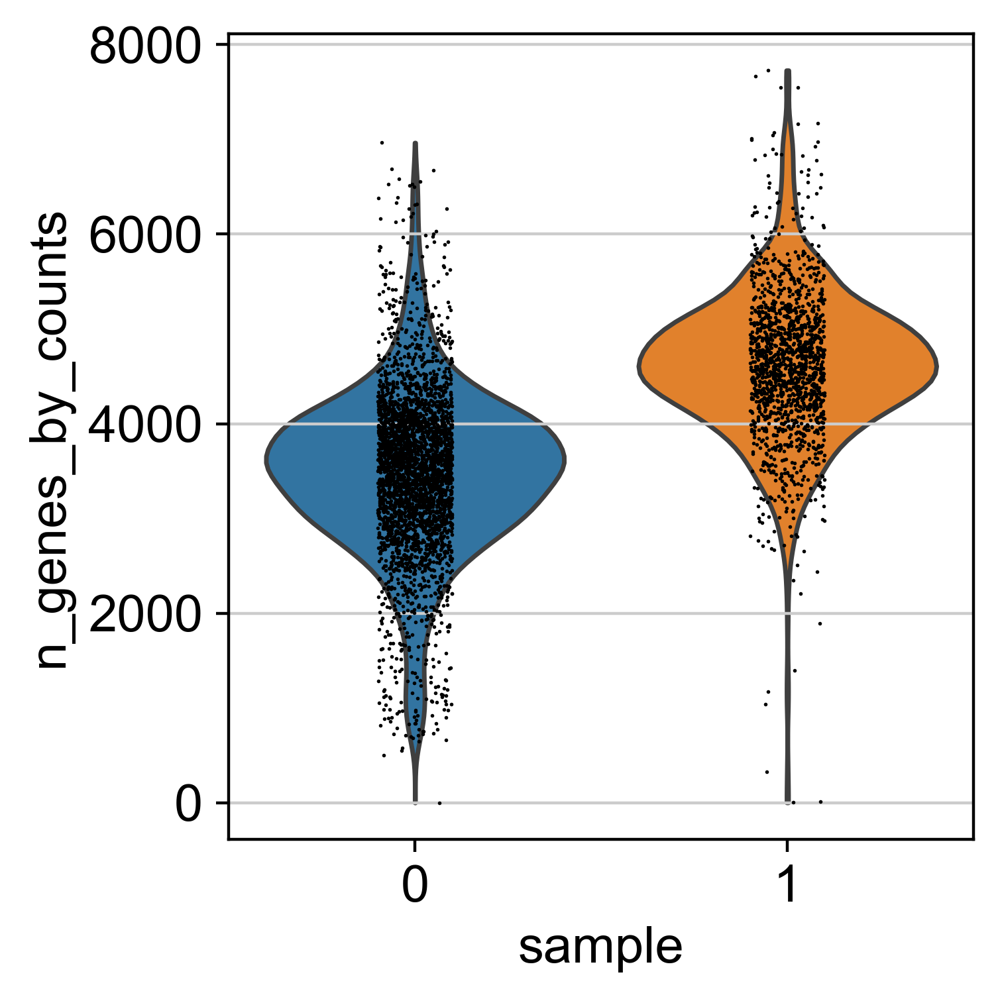

In [13]:
#violin plot
sc.pl.violin(target_adata, keys="n_genes_by_counts", groupby='sample')


In [10]:
target_adata.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes
spot_id,,,,,,,,,,,,
C-AK40378-AK40379_225GY5LT3_AAACAACGAATAGTTC-1,1,0,16,0,3775,8.236421,6952.0,8.846929,15.017261,20.195627,27.416571,41.297468
C-AK40378-AK40379_225GY5LT3_AAACAAGTATCTCCCA-1,1,50,102,0,1035,6.943122,1299.0,7.170120,18.090839,25.789069,35.719784,58.814473
C-AK40378-AK40379_225GY5LT3_AAACAATCTACTAGCA-1,1,3,43,0,5109,8.538955,11187.0,9.322598,12.523465,17.609726,24.644677,37.802807
C-AK40378-AK40379_225GY5LT3_AAACAGAGCGACTCCT-1,1,14,94,0,4353,8.378850,8717.0,9.073145,14.362739,18.974418,25.983710,39.164850
C-AK40378-AK40379_225GY5LT3_AAACAGCTTTCAGAAG-1,1,43,9,0,4108,8.320935,8380.0,9.033723,16.085919,21.324582,28.221957,41.670644
...,...,...,...,...,...,...,...,...,...,...,...,...
D-AK40380-AK40381_225GY5LT3_TTGTTAGCAAATTCGA-1,1,22,42,1,5021,8.521584,11946.0,9.388235,13.661477,18.801272,25.749205,38.858195
D-AK40380-AK40381_225GY5LT3_TTGTTCTAGATACGCT-1,1,21,3,1,4780,8.472405,10746.0,9.282382,12.953657,18.416155,25.414108,38.619021
D-AK40380-AK40381_225GY5LT3_TTGTTGTGTGTCAAGA-1,1,31,77,1,5624,8.634976,14777.0,9.600895,13.121743,18.149827,25.045679,38.106517


In [18]:
target_adata.var

,gene_ids,feature_types,genome,SYMBOL,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,MT_gene
SAMD11,ENSG00000187634,Gene Expression,GRCh38,SAMD11,39,0.011949,0.011878,98.805147,39.0,3.688879,False
NOC2L,ENSG00000188976,Gene Expression,GRCh38,NOC2L,1272,0.507966,0.410762,61.029412,1658.0,7.413970,False
KLHL17,ENSG00000187961,Gene Expression,GRCh38,KLHL17,235,0.073836,0.071237,92.800245,241.0,5.488938,False
PLEKHN1,ENSG00000187583,Gene Expression,GRCh38,PLEKHN1,9,0.003064,0.003059,99.724265,10.0,2.397895,False
PERM1,ENSG00000187642,Gene Expression,GRCh38,PERM1,22,0.006740,0.006718,99.325980,22.0,3.135494,False
...,...,...,...,...,...,...,...,...,...,...,...
TSPY1,ENSG00000258992,Gene Expression,GRCh38,TSPY1,0,0.000000,0.000000,100.000000,0.0,0.000000,False
USP9Y,ENSG00000114374,Gene Expression,GRCh38,USP9Y,220,0.069853,0.067521,93.259804,228.0,5.433722,False
DDX3Y,ENSG00000067048,Gene Expression,GRCh38,DDX3Y,1228,0.471201,0.386079,62.377451,1538.0,7.338888,False
TMSB4Y,ENSG00000154620,Gene Expression,GRCh38,TMSB4Y,44,0.013480,0.013390,98.651961,44.0,3.806663,False


In [19]:
source_adata.var

,feature_types,genome,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
TRIM63,Gene Expression,unknown,True,0.001340,0.407240,0.454033,6,False
CCP110,Gene Expression,unknown,True,0.144074,0.720043,0.438280,10,False
CCDC186,Gene Expression,unknown,True,0.137050,0.570207,0.270854,8,False
RTN1,Gene Expression,unknown,True,0.135925,0.771399,0.519078,11,False
RHOG,Gene Expression,unknown,True,0.435874,0.769815,-0.000273,6,False
...,...,...,...,...,...,...,...,...
OBSCN-AS1,Gene Expression,unknown,True,0.002452,0.254650,0.150558,6,False
H4C4,Gene Expression,unknown,True,0.002724,0.301861,0.195486,6,False
HOATZ,Gene Expression,unknown,True,0.017586,0.628281,0.806285,7,False
LINC02694,Gene Expression,unknown,True,0.002845,0.262499,0.326861,6,False


In [20]:
#check if matching var  bbtween source and target
print( len(set(source_adata.var.index) - set(target_adata.var.index) ))



481


In [14]:

map2 = pd.read_csv(
        "/Users/carbs/Downloads/Spatial_Meta/visium/A-AK40374-AK40375_225GY5LT3/SPATIAL_RNA_COUNTER_CS/SPATIAL_RNA_COUNTER/_TARGETED_ANALYZER/CALCULATE_TARGETED_METRICS/fork0/join-u63f66a1acf/files/per_feature_metrics_csv.csv"
    )
# extract only column with name probe_id
# mapp2 = mapp2[["probe_id"]]

# #split probe_ids ENSG00000000003|TSPAN6|41ef80c
# mapp2 = mapp2["probe_id"].str.split("|", expand=True)
# #rename columns
# mapp2.columns = ["gene_id", "gene_name", "somehashoridk"]

# keep only colums with name feature_type,feature_id,feature_name,
mapp2 = map2[["feature_type", "feature_id", "feature_name"]]
# rename columns
mapp2.columns = ["feature_type", "gene_id", "gene_name"]

# transfrom  b'ENSG00000130203' to ENSG00000130203 by removing b' and '
mapp2["gene_id"] = mapp2["gene_id"].str[2:-1]


diff_gene_names = list(set(source_adata.var.index) - set(target_adata.var.index))
print(len(diff_gene_names))
#find in gene set
gene_setttt = pd.read_csv("./genes_for_mapping_ok.csv")
gene_setttt.head()

for gene in diff_gene_names:
    #find index in gene_symbols
    # print(gene)
    ens_name = gene_setttt[gene_setttt['gene_symbols'] == gene]['Unnamed: 0'].values[0]
    # print(ens_name)

    #find it in map2

    lookup = mapp2[mapp2['gene_id'] == ens_name]['gene_name']
    #check if exists
    if lookup.empty:
        print('not found in map2', gene, ens_name)
    else:
        my_name = lookup.values[0]
        # print('found in map2', my_name)

        #rename gene in target_adata to my_name

        #chekc if genes name different
        if gene != my_name:
            print('different gene names', gene, my_name)

            target_adata.var.index = target_adata.var.index.str.replace(my_name, gene)

            
            print('replaced', my_name, gene)

dif_After_gene_names = list(set(source_adata.var.index) - set(target_adata.var.index))
before_gene_names = list(set(source_adata.var.index) - set(diff_gene_names))
print("before", len(before_gene_names))
print("after", len(dif_After_gene_names))

/var/folders/wk/1gf2_m552kl8lnst82lpjrn00000gn/T/ipykernel_96323/3032341153.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mapp2["gene_id"] = mapp2["gene_id"].str[2:-1]


481
different gene names AC133644.2 LINC01943
replaced LINC01943 AC133644.2
different gene names RP11-93H24.3 AL139089.1
replaced AL139089.1 RP11-93H24.3
different gene names H1-5 HIST1H1B
replaced HIST1H1B H1-5
not found in map2 GPX1 ENSG00000233276
different gene names AC002331.1 LINC02195
replaced LINC02195 AC002331.1
different gene names RP11-713P17.3 LINC02731
replaced LINC02731 RP11-713P17.3
different gene names RP11-305L7.1 AL158071.3
replaced AL158071.3 RP11-305L7.1
different gene names H4C9 HIST1H4I
replaced HIST1H4I H4C9
not found in map2 RP11-849I19.1 ENSG00000262280
different gene names IRAG2 LRMP
replaced LRMP IRAG2
different gene names RP11-347P5.1 AC114760.2
replaced AC114760.2 RP11-347P5.1
different gene names MARS1 MARS
replaced MARS MARS1
different gene names RP6-91H8.3 AC004817.3
replaced AC004817.3 RP6-91H8.3
different gene names PAXIP1-DT PAXIP1-AS1
replaced PAXIP1-AS1 PAXIP1-DT
different gene names H4C1 HIST1H4A
replaced HIST1H4A H4C1
different gene names RP11-305

In [20]:
diff_gene_names = list(set(source_adata.var.index) - set(target_adata.var.index))
print(len(diff_gene_names))

print(diff_gene_names)

#svae names to txt
with open("source_adatavar.txt", "w") as output:
    for row in source_adata.var.index:
        output.write(str(row) + '\n')


with open("target_adatavar.txt", "w") as output:
    for row in target_adata.var.index:
        output.write(str(row) + '\n')



428
['IGLC2', 'AC133644.2', 'RP11-93H24.3', 'RMRP', 'MINCR', 'DSE', 'CXCL6', 'RUNX1T1', 'LINC00685', 'SEC14L1', 'GPX1', 'AC002331.1', 'RP11-713P17.3', 'FOLR3', 'CBX7', 'XCL2', 'MT-ND5', 'SLC6A6', 'LINC01215', 'RP11-305L7.1', 'RN7SL832P', 'TMEM161B-AS1', 'CCT6A', 'VIM-AS1', 'CCL3L1', 'NEAT1', 'ZNF791', 'RP11-849I19.1', 'CKS1B', 'KCNE1', 'A2M-AS1', 'LEFTY2', 'YBX3', 'TUBB4B', 'PCAT19', 'RP11-347P5.1', 'ZNF83', 'TPSAB1', 'ZNF395', 'IGF2', 'RP6-91H8.3', 'PAXIP1-DT', 'RP11-305L7.3', 'HLA-B', 'RP11-356J5.12', 'CTA-29F11.1', 'AC015936.3', 'MALAT1', 'CCL3', 'TUBA1C', 'RPS6KL1', 'MIR22HG', 'CKS2', 'AP000769.1', 'GOLGA8B', 'HOXB-AS1', 'LINC-PINT', 'CH17-373J23.1', 'HSPA7', 'RP1-313I6.12', 'MT-CO3', 'FEN1', 'KIR3DX1', 'CACYBP', 'CHN2', 'SRGAP2B', 'ILF3-DT', 'TRGV5', 'LINC00240', 'RP11-620J15.3', 'CATSPER2', 'RP11-395G23.3', 'LL22NC03-2H8.5', 'CALCB', 'SLC6A8', 'CDK2AP2', 'HMGN2', 'GET4', 'LINC00861', 'MIR219A2', 'AC004158.3', 'MIR155HG', 'RP13-516M14.4', 'MRPS9', 'LINC01088', 'RGPD5', 'KRT17', 'C

In [16]:
target_adata.var

,gene_ids,feature_types,genome,SYMBOL,MT_gene,n_cells_by_counts-0,mean_counts-0,log1p_mean_counts-0,pct_dropout_by_counts-0,total_counts-0,log1p_total_counts-0,n_cells_by_counts-1,mean_counts-1,log1p_mean_counts-1,pct_dropout_by_counts-1,total_counts-1,log1p_total_counts-1
SAMD11,ENSG00000187634,Gene Expression,GRCh38,SAMD11,False,39,0.011949,0.011878,98.805147,39.0,3.688879,14,0.010547,0.010492,99.077126,16.0,2.833213
NOC2L,ENSG00000188976,Gene Expression,GRCh38,NOC2L,False,1272,0.507966,0.410762,61.029412,1658.0,7.413970,726,0.655241,0.503946,52.142386,994.0,6.902743
KLHL17,ENSG00000187961,Gene Expression,GRCh38,KLHL17,False,235,0.073836,0.071237,92.800245,241.0,5.488938,156,0.105471,0.100272,89.716546,160.0,5.081404
PLEKHN1,ENSG00000187583,Gene Expression,GRCh38,PLEKHN1,False,9,0.003064,0.003059,99.724265,10.0,2.397895,3,0.001978,0.001976,99.802241,3.0,1.386294
PERM1,ENSG00000187642,Gene Expression,GRCh38,PERM1,False,22,0.006740,0.006718,99.325980,22.0,3.135494,3,0.001978,0.001976,99.802241,3.0,1.386294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TSPY1,ENSG00000258992,Gene Expression,GRCh38,TSPY1,False,0,0.000000,0.000000,100.000000,0.0,0.000000,0,0.000000,0.000000,100.000000,0.0,0.000000
USP9Y,ENSG00000114374,Gene Expression,GRCh38,USP9Y,False,220,0.069853,0.067521,93.259804,228.0,5.433722,159,0.111404,0.105624,89.518787,169.0,5.135798
DDX3Y,ENSG00000067048,Gene Expression,GRCh38,DDX3Y,False,1228,0.471201,0.386079,62.377451,1538.0,7.338888,712,0.649967,0.500755,53.065260,986.0,6.894670
TMSB4Y,ENSG00000154620,Gene Expression,GRCh38,TMSB4Y,False,44,0.013480,0.013390,98.651961,44.0,3.806663,41,0.027027,0.026668,97.297297,41.0,3.737670


In [21]:

def subset_and_pad_adata(gene_set, adata):
    """
    This function uses a gene list provided as a Pandas dataframe with gene symbols and
    Ensembl IDs and subsets a larger Anndata object to only the genes in this list. If
    Not all genes are found in the AnnData object, then zero-padding is performed.
    """
    # Example inputs:
    # genes_filename = '/storage/groups/ml01/workspace/hlca_lisa.sikkema_malte.luecken/genes_for_mapping.csv'
    # data_filename = '/storage/groups/ml01/workspace/hlca_lisa.sikkema_malte.luecken/ready/adams.h5ad'
    # gene_set = pd.read_csv(genes_filename)
    # adata = sc.read(data_filename)

    # Prep objects
    if 'gene_symbols' in gene_set.columns:
        gene_set.index = gene_set['gene_symbols']

    else:
        raise ValueError('The input gene list was not of the expected type!\n'
                         'Gene symbols and ensembl IDs are expected in column names:\n'
                         '\t`gene_symbols` and `Unnamed: 0`')

    # Subset adata object
    common_genes = [gene for gene in gene_set['gene_symbols'].values if gene in adata.var_names]
    if len(common_genes) == 0:
        print("WARNING: YOU SHOULD PROBABLY SWITCH YOUR ADATA.VAR INDEX COLUMN TO GENE NAMES"
                  " RATHER THAN IDS! No genes were recovered.")
        return

    adata_sub = adata[:,common_genes].copy()

    # Pad object with 0 genes if needed
    if len(common_genes) < len(gene_set):
        diff = len(gene_set) - len(common_genes)
        print(f'not all genes were recovered, filling in 0 counts for {diff} missing genes...')

        #get missing genes
        miss = gene_set[~gene_set['gene_symbols'].isin(common_genes)]
        print(miss)
        
        # Genes to pad with
        genes_to_add = set(gene_set['gene_symbols'].values).difference(set(adata_sub.var_names))
        genes_to_add = list(genes_to_add)
        new_var = gene_set.loc[genes_to_add]
        
        if 'Unnamed: 0' in new_var.columns:
            # Assumes the unnamed column are ensembl values
            new_var['ensembl'] = new_var['Unnamed: 0']
            del new_var['Unnamed: 0']

        df_padding = pd.DataFrame(data=np.zeros((adata_sub.shape[0],len(genes_to_add))), index=adata_sub.obs_names, columns=new_var.index)
        adata_padding = sc.AnnData(df_padding, var=new_var)
        
        # Concatenate object
        adata_sub = anndata.concat([adata_sub, adata_padding], axis=1, join='outer', index_unique=None, merge='unique')

    # Ensure ensembl IDs are available
    adata_sub.var['ensembl'] = gene_set['Unnamed: 0']

    return adata_sub

gene_set = pd.read_csv("./genes_for_mapping_ok.csv")
#save gene set as csv

gene_set.head()



target_adata = subset_and_pad_adata(gene_set, target_adata)

not all genes were recovered, filling in 0 counts for 428 missing genes...
                   Unnamed: 0 gene_symbols
gene_symbols                              
CKS2          ENSG00000123975         CKS2
ARL6IP1       ENSG00000170540      ARL6IP1
RCOR2         ENSG00000167771        RCOR2
RGS10         ENSG00000148908        RGS10
BOLA2B        ENSG00000169627       BOLA2B
...                       ...          ...
MANEA-DT      ENSG00000261366     MANEA-DT
H2AC19        ENSG00000272196       H2AC19
ATP2B1-AS1    ENSG00000271614   ATP2B1-AS1
H2AC16        ENSG00000276903       H2AC16
OBSCN-AS1     ENSG00000162913    OBSCN-AS1

[428 rows x 2 columns]


In [22]:
difff = list(set(source_adata.var.index) - set(target_adata.var.index))
difff

[]

In [23]:
#get gene symbols from source adata
source_adata.var.index


,feature_types,genome,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
TRIM63,Gene Expression,unknown,True,0.001340,0.407240,0.454033,6,False
CCP110,Gene Expression,unknown,True,0.144074,0.720043,0.438280,10,False
CCDC186,Gene Expression,unknown,True,0.137050,0.570207,0.270854,8,False
RTN1,Gene Expression,unknown,True,0.135925,0.771399,0.519078,11,False
RHOG,Gene Expression,unknown,True,0.435874,0.769815,-0.000273,6,False
...,...,...,...,...,...,...,...,...
OBSCN-AS1,Gene Expression,unknown,True,0.002452,0.254650,0.150558,6,False
H4C4,Gene Expression,unknown,True,0.002724,0.301861,0.195486,6,False
HOATZ,Gene Expression,unknown,True,0.017586,0.628281,0.806285,7,False
LINC02694,Gene Expression,unknown,True,0.002845,0.262499,0.326861,6,False


In [68]:
target_adata.var.index

Index(['TRIM63', 'CCP110', 'CCDC186', 'RTN1', 'RHOG', 'SGO1', 'TPM2', 'TNRC6C',
       'ZNF559', 'ANKAR',
       ...
       'PPIAL4G', 'RP11-1143G9.4', 'XXbac-BPGBPG55C20.2', 'MRPS31',
       'LINC00239', 'KRT86', 'OVOL1', 'SERTAD4-AS1', 'STEAP1B', 'MT-CO3'],
      dtype='object', length=5000)

In [18]:
source_adata.obs_keys  


<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 338564 × 5000
    obs: 'author', 'patient', 'method', 'CellID', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var'
    var: 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi', 'hvg', '_scvi_uuid', '_scvi_manager_uuid'
    layers: 'counts'>

In [43]:
adata_query = sca.models.SCANVI.prepare_query_anndata(
    adata=target_adata, reference_model=ref_path_coberted, inplace=False
)

#this fixes the indexes and sortst them coreclt

INFO     File /Users/carbs/Downloads/Spatial_Meta/scraches_down_converted_fromlegacy/model.pt already downloaded   
INFO     Found 100.0% reference vars in query data.                                                                


In [44]:
adata_query.var.index

Index(['TRIM63', 'CCP110', 'CCDC186', 'RTN1', 'RHOG', 'SGO1', 'TPM2', 'CKS2',
       'ARL6IP1', 'RCOR2',
       ...
       'GUCY1A1', 'PLAAT1', 'PPDPFL', 'H2AC16', 'H4C1', 'OBSCN-AS1', 'H4C4',
       'HOATZ', 'LINC02694', 'MUCL3'],
      dtype='object', length=5000)

In [41]:
source_adata.var.index

Index(['TRIM63', 'CCP110', 'CCDC186', 'RTN1', 'RHOG', 'SGO1', 'TPM2', 'CKS2',
       'ARL6IP1', 'RCOR2',
       ...
       'GUCY1A1', 'PLAAT1', 'PPDPFL', 'H2AC16', 'H4C1', 'OBSCN-AS1', 'H4C4',
       'HOATZ', 'LINC02694', 'MUCL3'],
      dtype='object', length=5000)

In [45]:
adata_query.obs["author"] = "Luka_batch_1"

#IMPORTANT IT HAS TO BE THE SAME AS THE SOURCE ADATA JUST TAKE ONE CELL TYPE FROM THE SOURCE ADATA
adata_query.obs[cell_type_key] = source_adata.obs[cell_type_key][0]


/var/folders/wk/1gf2_m552kl8lnst82lpjrn00000gn/T/ipykernel_96323/453259350.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata_query.obs[cell_type_key] = source_adata.obs[cell_type_key][0]


In [46]:
model = sca.models.SCANVI.load_query_data(
    adata_query, 
    ref_path_coberted,
    freeze_dropout = True,
    inplace_subset_query_vars = True 
    # your adata must have the same gene length (5000) and names as the GBmap core (source_adata)
    # `inplace_subset_query_vars = True` will subset and reorder the vars to tarin the model properly
    # In case you want to subet and tidy up your AnnData object beforehand, you can use the file genes_for_mapping.csv uploaded in this repository
    # and the function `subset_and_pad_adata` developed by Lisa Sikkema and Theis team
    # You can find it here: https://github.com/LungCellAtlas/HLCA_reproducibility/blob/main/scripts/preprocessing.py 
)

model._unlabeled_indices = np.arange(target_adata.n_obs)
model._labeled_indices = []
print("Labelled Indices: ", len(model._labeled_indices))
print("Unlabelled Indices: ", len(model._unlabeled_indices))

INFO     File /Users/carbs/Downloads/Spatial_Meta/scraches_down_converted_fromlegacy/model.pt already downloaded   
mappinggggg ['Bhaduri2020' 'Couturier2020' 'Darmanis2017' 'Goswami2019' 'Johnson2020'
 'Mathewson2021' 'Neftel2019_10x' 'Neftel2019_smart' 'Pombo2021'
 'Richards2021' 'Sankowski2019' 'Wang2019' 'Wang2020' 'Wu2020' 'Yu2020'
 'Yuan2018' 'Zhao2020']
mappinggggg extend_categories True
searching for Luka_batch_1
not found Luka_batch_1 in ['Bhaduri2020' 'Couturier2020' 'Darmanis2017' 'Goswami2019' 'Johnson2020'
 'Mathewson2021' 'Neftel2019_10x' 'Neftel2019_smart' 'Pombo2021'
 'Richards2021' 'Sankowski2019' 'Wang2019' 'Wang2020' 'Wu2020' 'Yu2020'
 'Yuan2018' 'Zhao2020']
mappinggggg ['AC-like' 'Astrocyte' 'B cell' 'CD4/CD8' 'DC' 'Endothelial' 'MES-like'
 'Mast' 'Mono' 'Mural cell' 'NK' 'NPC-like' 'Neuron' 'OPC' 'OPC-like'
 'Oligodendrocyte' 'Plasma B' 'RG' 'TAM-BDM' 'TAM-MG']
mappinggggg extend_categories False
searching for MES-like
Labelled Indices:  0
Unlabelled Indices:  4781

/Users/carbs/miniforge3/envs/ai/lib/python3.11/site-packages/scvi/model/_scanvi.py:140: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(


In [47]:



surgery_epochs = 500

#USE UDATED  early_stopping_kwargs_surgery 
early_stopping_kwargs_surgery = {
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
    "plan_kwargs": {"weight_decay": 0.0},
}
model.train(max_epochs=surgery_epochs, **early_stopping_kwargs_surgery,accelerator="cpu")

# model.train(
#     max_epochs=surgery_epochs,
#     train_base_model=False,
#     semisupervised_trainer_kwargs=dict(metrics_to_monitor=["accuracy", "elbo"],
#                                        weight_decay=0,
#                                        early_stopping_kwargs=early_stopping_kwargs_surgery
#                                       ),
#     check_val_every_n_epoch=1
# )

INFO     Training for 500 epochs.                                                                                  


INFO: GPU available: True (mps), used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (mps), used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/Users/carbs/miniforge3/envs/ai/lib/python3.11/site-packages/lightning/pytorch/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(


Epoch 1/500:   0%|          | 0/500 [00:00<?, ?it/s]

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.



Epoch 500/500: 100%|██████████| 500/500 [12:46<00:00,  1.51s/it, v_num=1, train_loss_step=3.56e+3, train_loss_epoch=3.54e+3]

INFO: `Trainer.fit` stopped: `max_epochs=500` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|██████████| 500/500 [12:46<00:00,  1.53s/it, v_num=1, train_loss_step=3.56e+3, train_loss_epoch=3.54e+3]


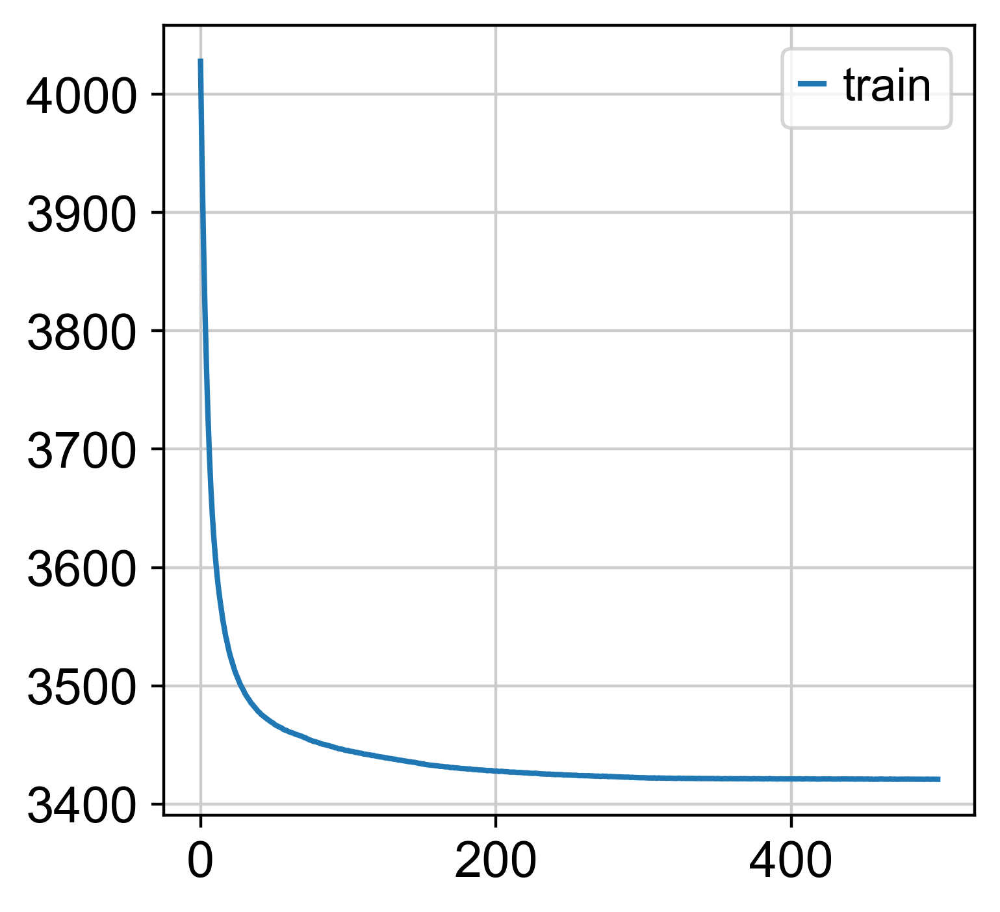

In [51]:
#plot training
model.history["elbo_train"]


plt.plot(model.history["elbo_train"], label="train")
plt.legend()
plt.show()





In [19]:
#save model
model.save("scarches_SCANVI_core_GBmap_surgery", overwrite=True)

In [52]:
query_latent = sc.AnnData(model.get_latent_representation())
#add metadata to my latent representation
query_latent.obs = adata_query.obs.loc[adata_query.obs.index, :]
query_latent.obs['predictions'] = model.predict() # get predictions of cell anotation from the model


In [53]:
query_latent.obs["ref_or_query"] = "query"
source_adata.obs["ref_or_query"] = "ref"

/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


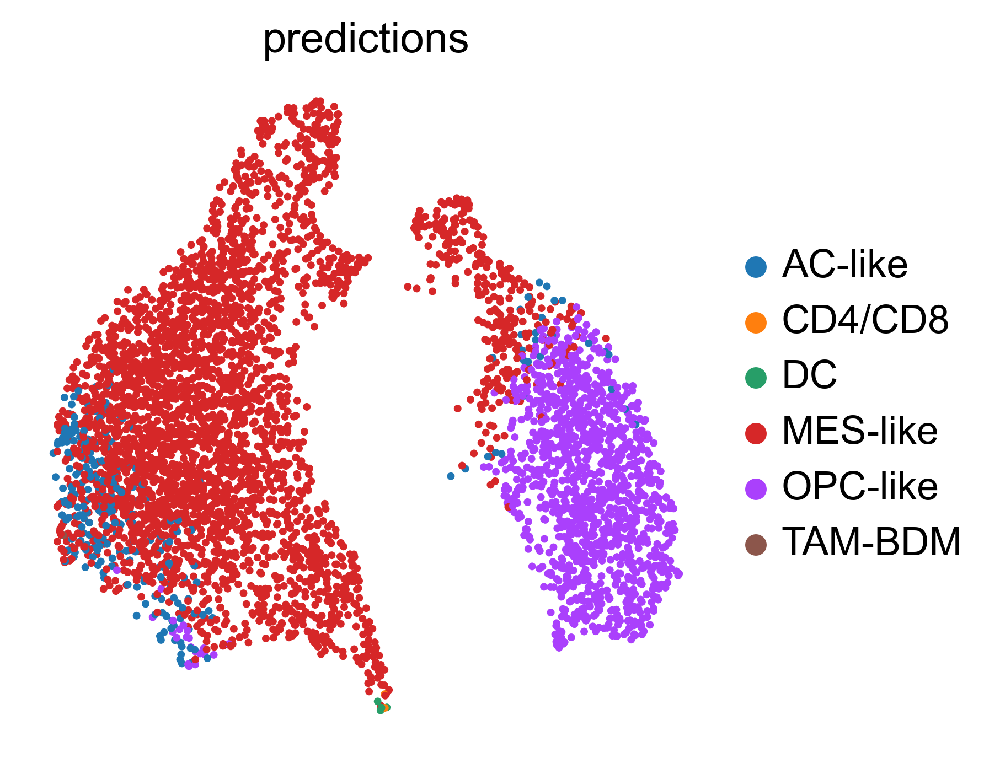

In [54]:
## Visualization
sc.pp.neighbors(query_latent)
sc.tl.leiden(query_latent)
sc.tl.umap(query_latent)

sc.pl.umap(query_latent,
           color=['predictions'],
           frameon=False,
           wspace=0.6,
           )

/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


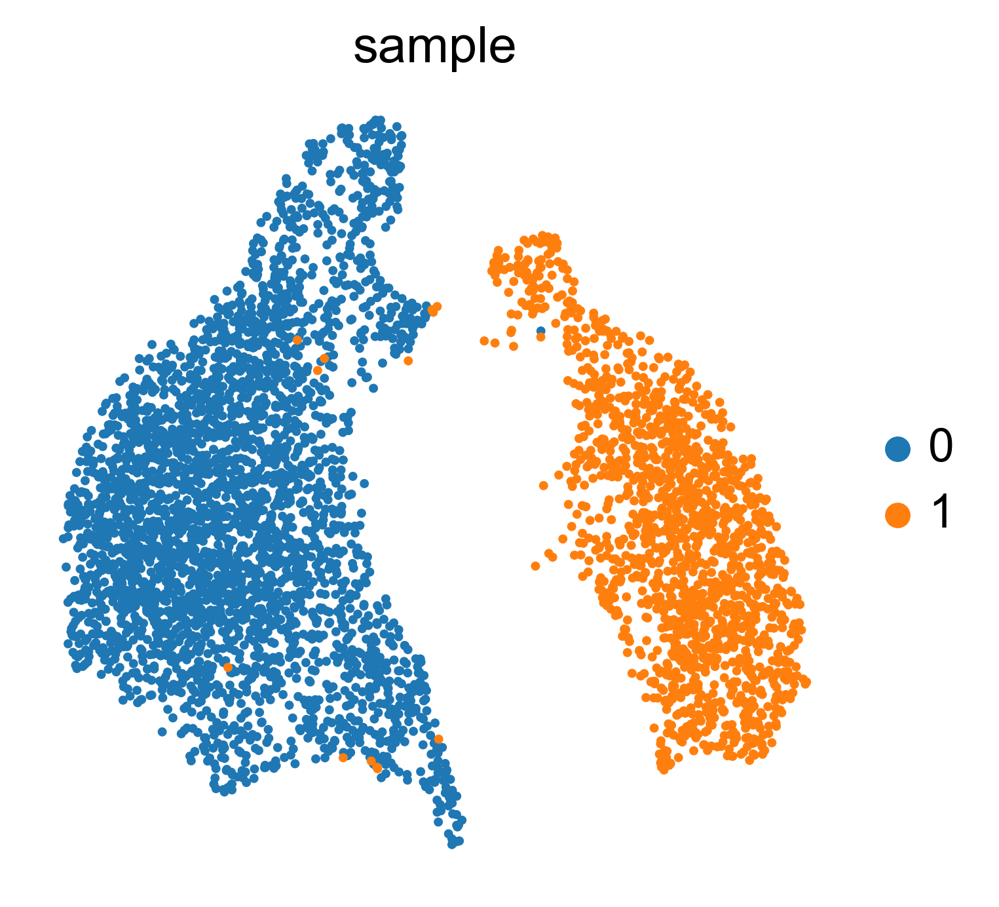

In [56]:
#group by sample
sc.pl.umap(query_latent,
           color=['sample'],
           frameon=False,
           wspace=0.6,
           )


/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


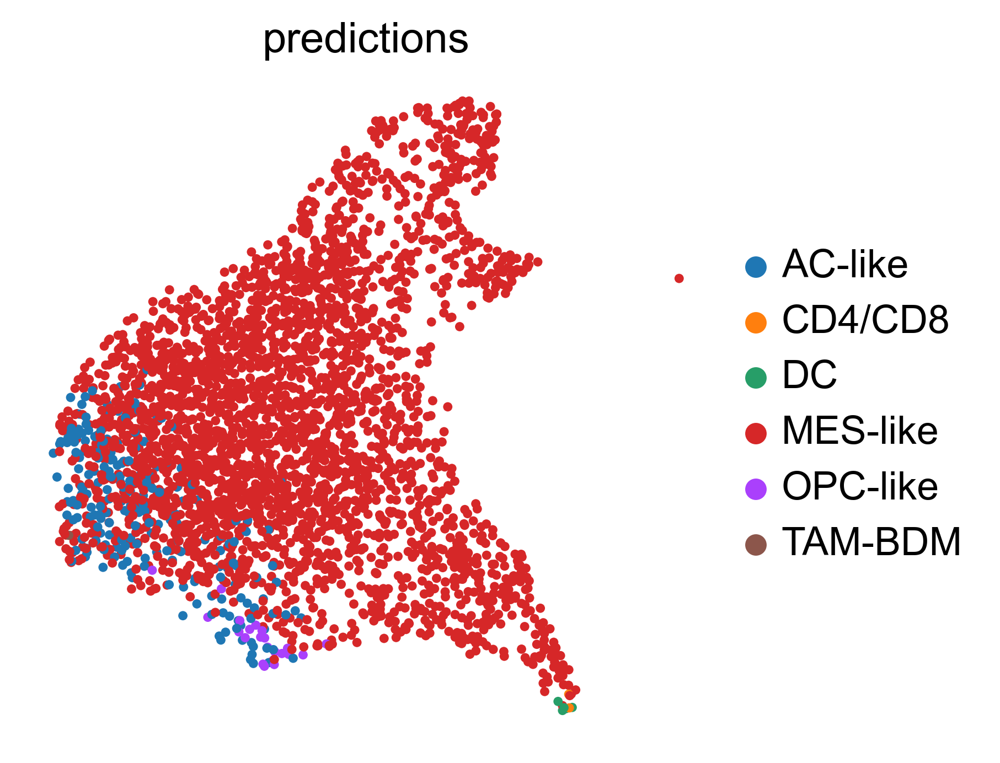

/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


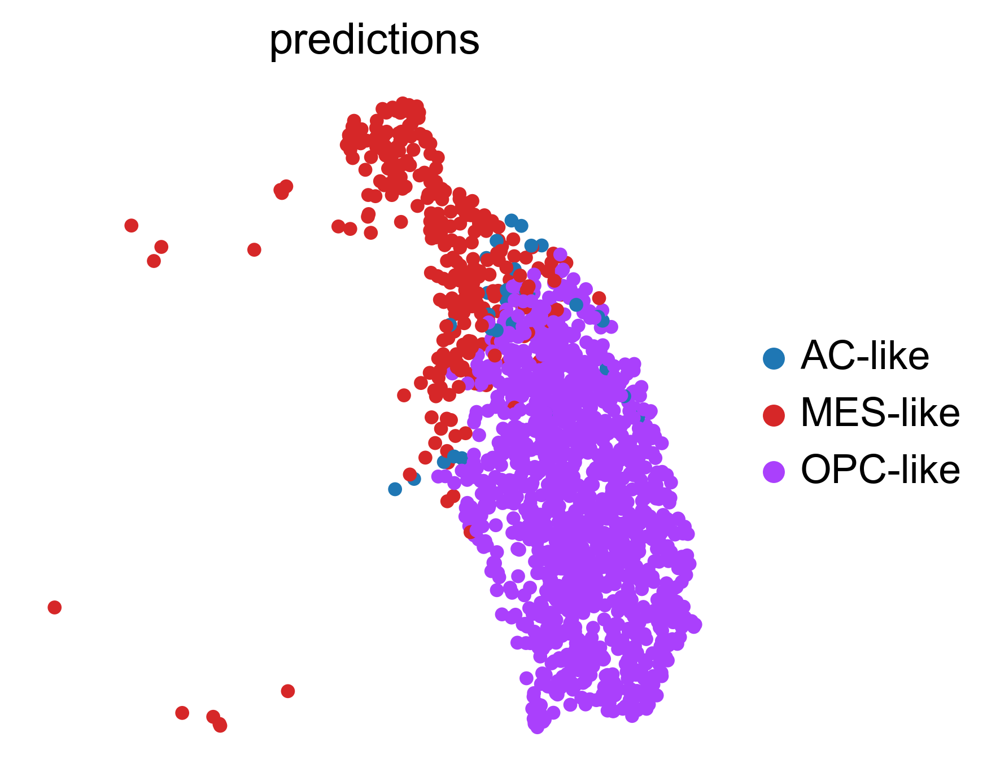

/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


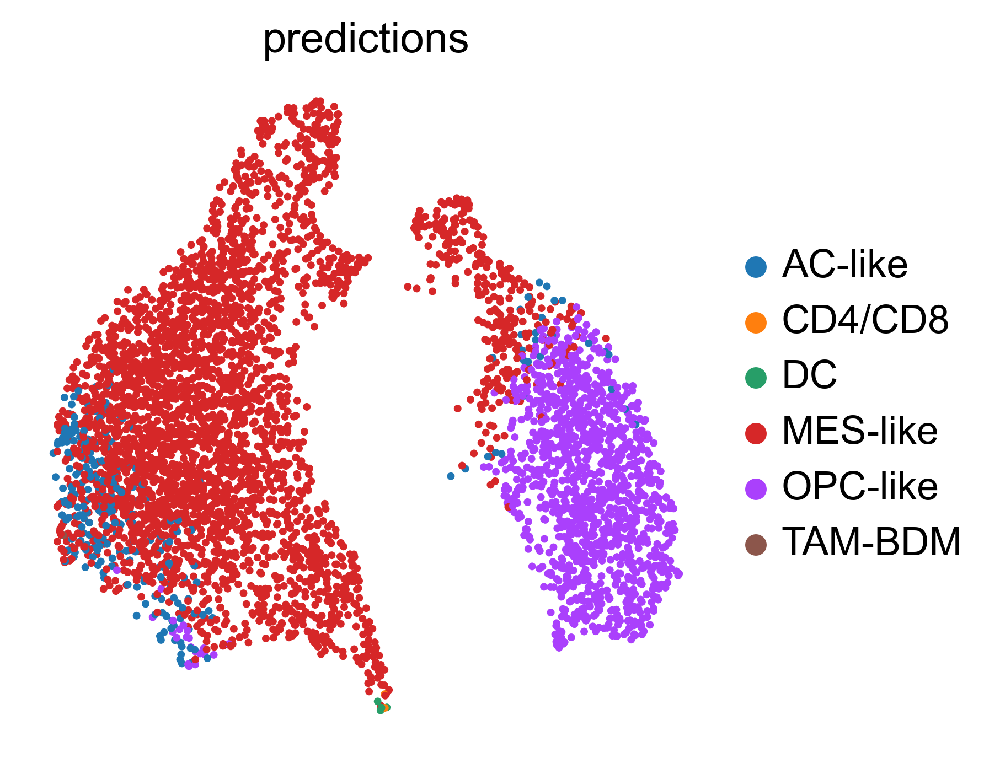

In [109]:
#show only predictions on sample C
sc.pl.umap(query_latent[query_latent.obs['sample'] == '0'],
           color=['predictions'],
           frameon=False,
           wspace=0.6,
        
           )

#show only predictions on sample D
sc.pl.umap(query_latent[query_latent.obs['sample'] == '1'],
           color=['predictions'],
           frameon=False,
           wspace=0.6,
        
           )

#plot grid by predictions
sc.pl.umap(query_latent,
           color=['predictions'],
           frameon=False,
           wspace=0.6,
           ncols=3,
           )


#print counts for each cell type for each sample
query_latent.obs.groupby(['sample', 'predictions']).size().unstack(fill_value=0)


In [116]:
query_latent.obs.groupby(['sample', 'predictions']).size().unstack(fill_value=0)


/var/folders/wk/1gf2_m552kl8lnst82lpjrn00000gn/T/ipykernel_96323/3666619035.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  query_latent.obs.groupby(['sample', 'predictions']).size().unstack(fill_value=0)


predictions,AC-like,CD4/CD8,DC,MES-like,OPC-like,TAM-BDM
sample,,,,,,
0,219,2,5,3015,22,1
1,30,0,0,296,1191,0


/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


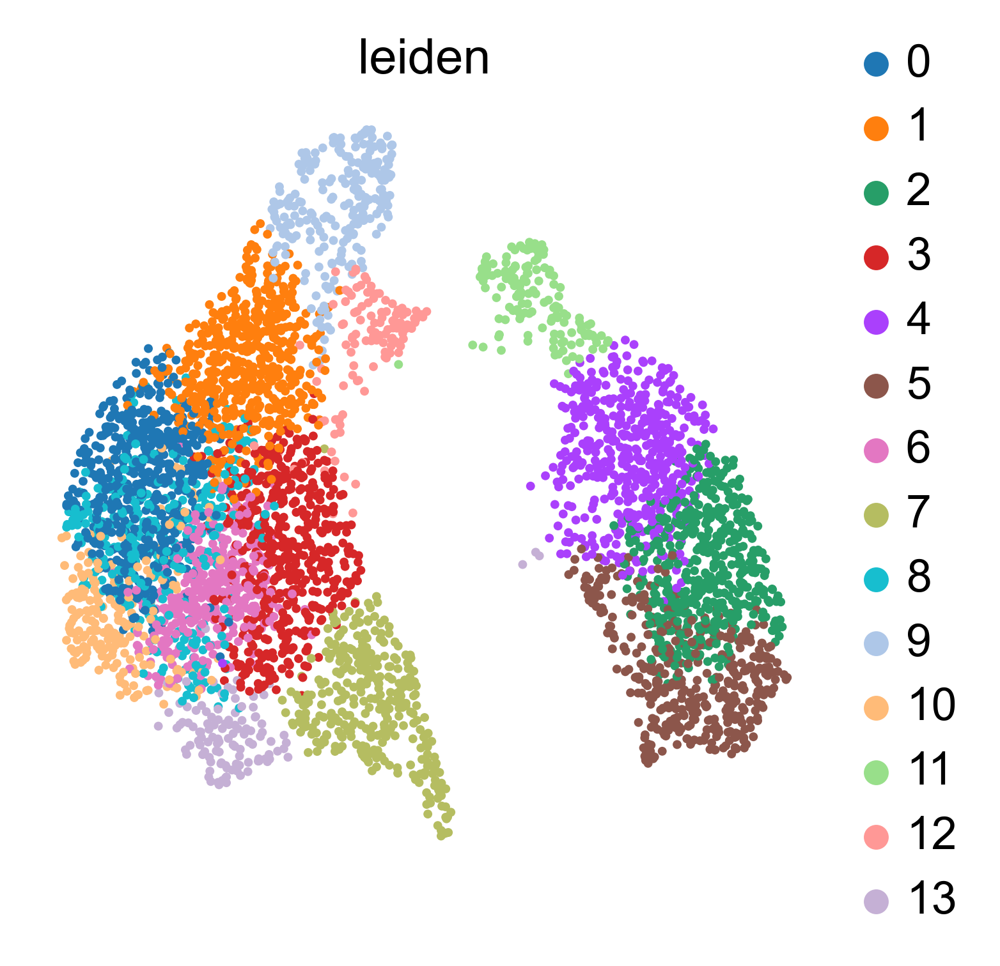

In [66]:
sc.pl.umap(query_latent,
           color=['leiden'],
           frameon=False,
           wspace=0.6,
           )

In [63]:
#save latent representation-latns
query_latent.write("./scarches_SCANVI)latens1.h5ad")



: 

In [29]:
#plot spatial
# target_adata
query_latent

AnnData object with n_obs × n_vars = 2565 × 10
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'CellID', 'author', '_scvi_batch', '_scvi_labels', 'predictions', 'ref_or_query', 'leiden'
    uns: 'neighbors', 'leiden', 'umap', 'predictions_colors', 'leiden_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [42]:
target_adata

AnnData object with n_obs × n_vars = 2565 × 5000
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'CellID', 'author', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'genome', 'SYMBOL', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'MT_gene', 'gene_symbols', 'ensembl'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'CellID_colors', 'sample_colors'
    obsm: 'spatial', 'MT'
    layers: 'counts'

In [55]:
query_latent.obs['predictions']

spot_id
A-AK40374-AK40375_225GY5LT3_AAACAACGAATAGTTC-1    OPC-like
A-AK40374-AK40375_225GY5LT3_AAACACCAATAACTGC-1          DC
A-AK40374-AK40375_225GY5LT3_AAACAGAGCGACTCCT-1    OPC-like
A-AK40374-AK40375_225GY5LT3_AAACAGCTTTCAGAAG-1    MES-like
A-AK40374-AK40375_225GY5LT3_AAACAGGGTCTATATT-1    MES-like
                                                    ...   
A-AK40374-AK40375_225GY5LT3_TTGTTCAGTGTGCTAC-1    MES-like
A-AK40374-AK40375_225GY5LT3_TTGTTCTAGATACGCT-1    MES-like
A-AK40374-AK40375_225GY5LT3_TTGTTGTGTGTCAAGA-1    MES-like
A-AK40374-AK40375_225GY5LT3_TTGTTTCACATCCAGG-1    MES-like
A-AK40374-AK40375_225GY5LT3_TTGTTTCATTAGTCTA-1    MES-like
Name: predictions, Length: 2565, dtype: category
Categories (8, object): ['AC-like', 'CD4/CD8', 'DC', 'MES-like', 'OPC-like', 'Oligodendrocyte', 'TAM-BDM', 'TAM-MG']

In [61]:
query_latent

AnnData object with n_obs × n_vars = 2565 × 10
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'CellID', 'author', '_scvi_batch', '_scvi_labels', 'predictions', 'ref_or_query', 'leiden'
    uns: 'neighbors', 'leiden', 'umap', 'predictions_colors', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [71]:
adata_full = source_adata.concatenate(adata_query, batch_key="ref_query")
full_latent = sc.AnnData(model.get_latent_representation(adata=adata_full))


/var/folders/wk/1gf2_m552kl8lnst82lpjrn00000gn/T/ipykernel_96323/3523603327.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_full = source_adata.concatenate(adata_query, batch_key="ref_query")


INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/Users/carbs/miniforge3/envs/ai/lib/python3.11/site-packages/anndata/_core/merge.py:1356: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


mappinggggg ['Bhaduri2020' 'Couturier2020' 'Darmanis2017' 'Goswami2019' 'Johnson2020'
 'Mathewson2021' 'Neftel2019_10x' 'Neftel2019_smart' 'Pombo2021'
 'Richards2021' 'Sankowski2019' 'Wang2019' 'Wang2020' 'Wu2020' 'Yu2020'
 'Yuan2018' 'Zhao2020' 'Luka_batch_1']
mappinggggg extend_categories False
searching for Bhaduri2020
searching for Couturier2020
searching for Darmanis2017
searching for Goswami2019
searching for Johnson2020
searching for Luka_batch_1
searching for Mathewson2021
searching for Neftel2019_10x
searching for Neftel2019_smart
searching for Pombo2021
searching for Richards2021
searching for Sankowski2019
searching for Wang2019
searching for Wang2020
searching for Wu2020
searching for Yu2020
searching for Yuan2018
searching for Zhao2020
mappinggggg ['AC-like' 'Astrocyte' 'B cell' 'CD4/CD8' 'DC' 'Endothelial' 'MES-like'
 'Mast' 'Mono' 'Mural cell' 'NK' 'NPC-like' 'Neuron' 'OPC' 'OPC-like'
 'Oligodendrocyte' 'Plasma B' 'RG' 'TAM-BDM' 'TAM-MG' 'Unknown']
mappinggggg extend_cat

In [85]:
#set metadata
full_latent.obs = adata_full.obs.loc[adata_full.obs.index, :]

In [92]:
full_latent

AnnData object with n_obs × n_vars = 343345 × 10
    obs: 'author', 'patient', 'method', 'CellID', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'ref_or_query', 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'ref_query', 'predictions'
    uns: 'neighbors', 'leiden', 'umap', 'leiden_colors', 'predictions_colors', 'sample_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [ ]:
sc.pp.neighbors(full_latent)
sc.tl.leiden(full_latent)
sc.tl.umap(full_latent)



In [88]:
#add pre
full_latent.obs['predictions'] = model.predict(adata=adata_full)

full_latent.obs['og_predictions'] = adata_full.obs['predictions']




/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


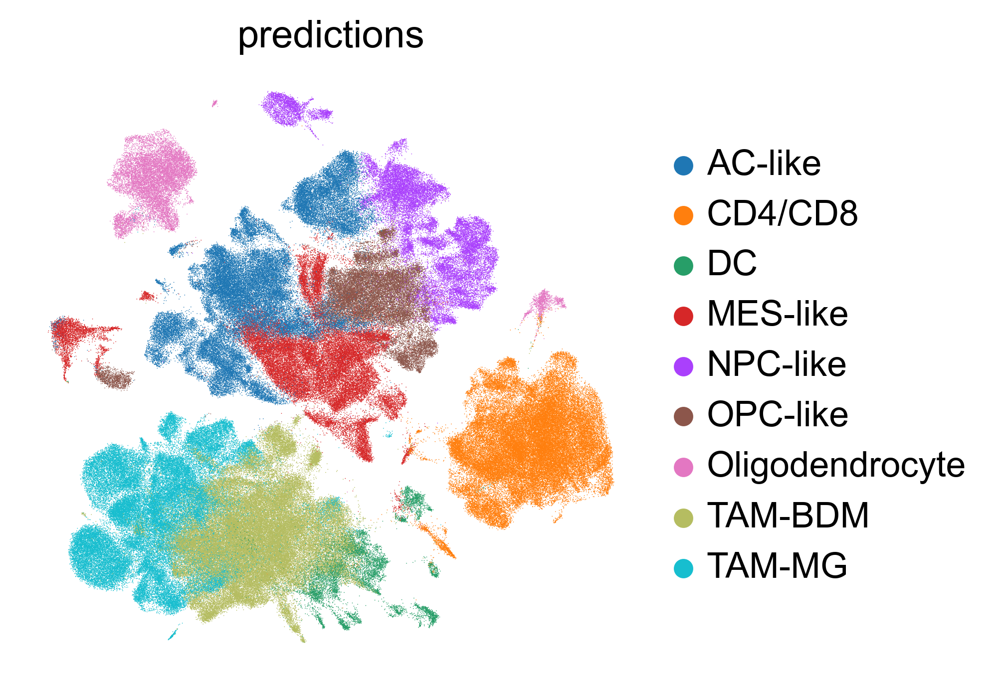

In [95]:
sc.pl.umap(full_latent,
           frameon=False,
           wspace=0.6,
              color=['predictions'],   
           )

In [114]:
 #gett acuuarcy on predicting the source dont use  ref_query 1
predss = full_latent.obs[ full_latent.obs['ref_query'] == '0' ]['predictions']
og = full_latent.obs[ full_latent.obs['ref_query'] == '0' ]['CellID']
og

#accuracy
from sklearn.metrics import accuracy_score
accuracy_score(og, predss)


0.8891081154523222

In [110]:
full_latent.obs

,author,patient,method,CellID,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var,ref_or_query,in_tissue,...,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,ref_query,predictions,leiden
PJ017_0-0,Yuan2018,PJ017,cell,MES-like,15,6,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,MES-like,5
PJ017_1-0,Yuan2018,PJ017,cell,OPC-like,15,14,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,MES-like,3
PJ017_2-0,Yuan2018,PJ017,cell,TAM-BDM,15,18,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,TAM-BDM,0
PJ017_3-0,Yuan2018,PJ017,cell,MES-like,15,6,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,MES-like,5
PJ017_4-0,Yuan2018,PJ017,cell,AC-like,15,0,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,AC-like,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D-AK40380-AK40381_225GY5LT3_TTGTTAGCAAATTCGA-1-1,Luka_batch_1,NaN,NaN,MES-like,17,6,NaN,NaN,NaN,1.0,...,8.521584,11946.0,9.388235,13.661477,18.801272,25.749205,38.858195,1,OPC-like,41
D-AK40380-AK40381_225GY5LT3_TTGTTCTAGATACGCT-1-1,Luka_batch_1,NaN,NaN,MES-like,17,6,NaN,NaN,NaN,1.0,...,8.472405,10746.0,9.282382,12.953657,18.416155,25.414108,38.619021,1,OPC-like,41
D-AK40380-AK40381_225GY5LT3_TTGTTGTGTGTCAAGA-1-1,Luka_batch_1,NaN,NaN,MES-like,17,6,NaN,NaN,NaN,1.0,...,8.634976,14777.0,9.600895,13.121743,18.149827,25.045679,38.106517,1,OPC-like,41
D-AK40380-AK40381_225GY5LT3_TTGTTTCCATACAACT-1-1,Luka_batch_1,NaN,NaN,MES-like,17,6,NaN,NaN,NaN,1.0,...,8.427268,9944.0,9.204825,13.093323,18.604183,25.653660,39.390587,1,OPC-like,41


/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


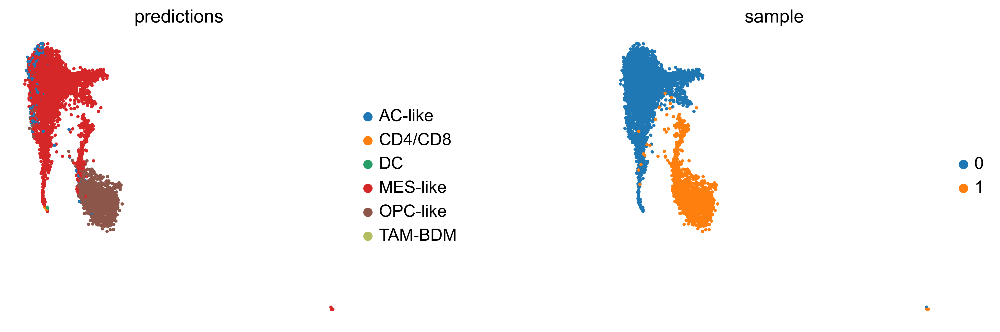

In [108]:
#show predictions of only C and D together and mark them with different colors
sc.pl.umap(full_latent[full_latent.obs['author'] == 'Luka_batch_1'],
           frameon=False,
           wspace=0.6,
              color=['predictions','sample'],

         
            
           )





/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


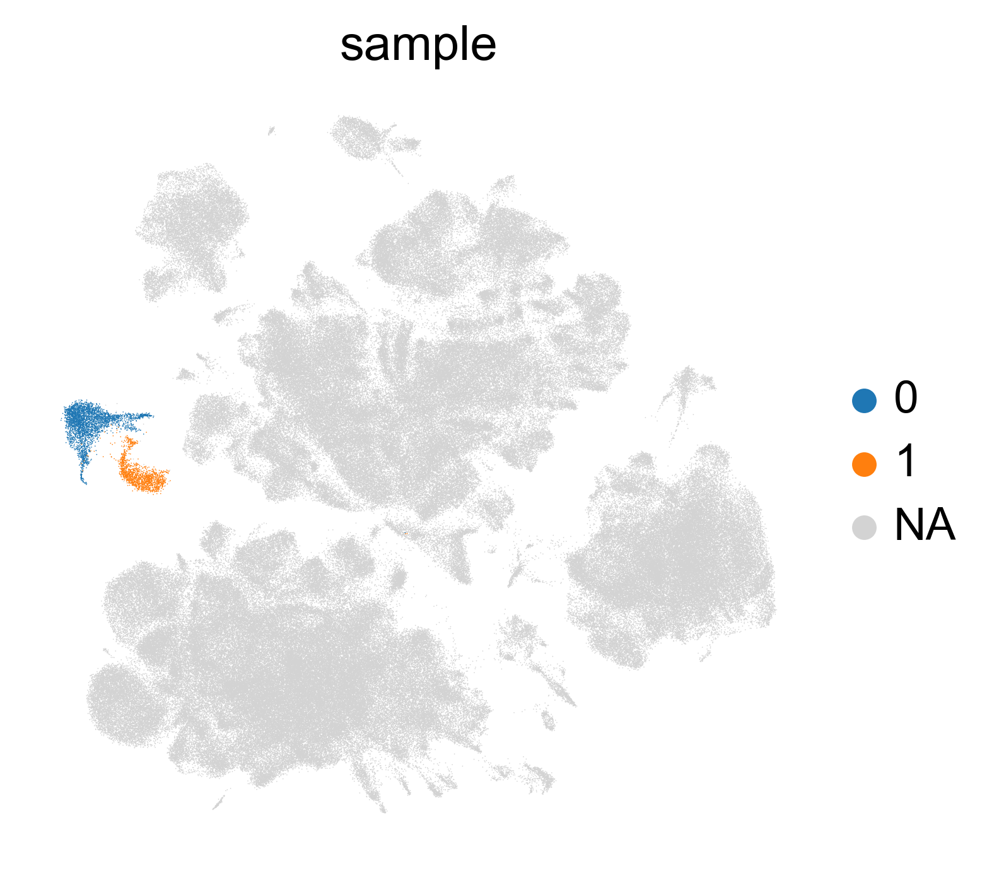

In [96]:
sc.pl.umap(full_latent,
           frameon=False,
           wspace=0.6,
              color=['sample'],   
           )


#predict




/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


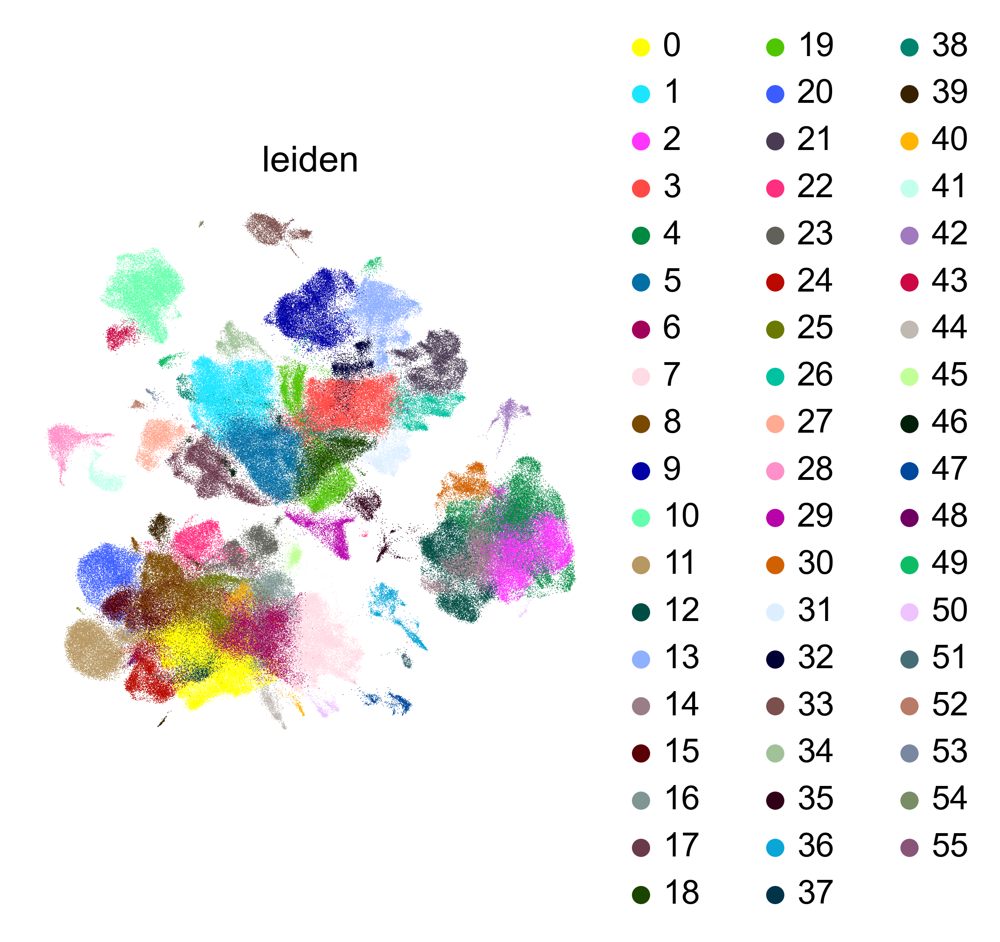

In [97]:
#laiedn

sc.pl.umap(full_latent,
              frameon=False,
              wspace=0.6,
                  color=['leiden'],   
              )


/Users/carbs/Downloads/Spatial_Meta/scanpy/scanpy/plotting/_tools/scatterplots.py:401: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


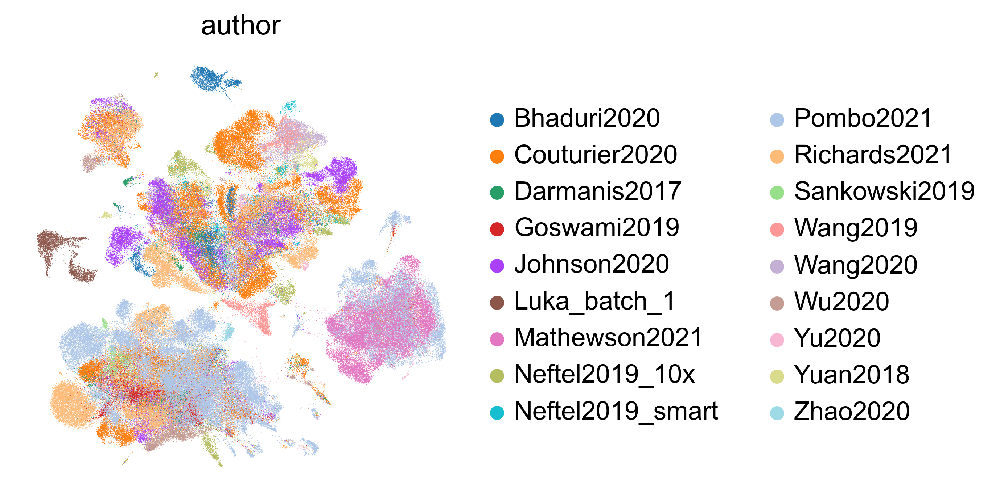

In [115]:
#author
sc.pl.umap(full_latent,
              frameon=False,
              wspace=0.6,
                  color=['author'],   
              )

In [98]:
full_latent.obs

,author,patient,method,CellID,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var,ref_or_query,in_tissue,...,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,ref_query,predictions,leiden
PJ017_0-0,Yuan2018,PJ017,cell,MES-like,15,6,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,MES-like,5
PJ017_1-0,Yuan2018,PJ017,cell,OPC-like,15,14,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,MES-like,3
PJ017_2-0,Yuan2018,PJ017,cell,TAM-BDM,15,18,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,TAM-BDM,0
PJ017_3-0,Yuan2018,PJ017,cell,MES-like,15,6,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,MES-like,5
PJ017_4-0,Yuan2018,PJ017,cell,AC-like,15,0,6.441088,0.417351,ref,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,AC-like,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
D-AK40380-AK40381_225GY5LT3_TTGTTAGCAAATTCGA-1-1,Luka_batch_1,NaN,NaN,MES-like,17,6,NaN,NaN,NaN,1.0,...,8.521584,11946.0,9.388235,13.661477,18.801272,25.749205,38.858195,1,OPC-like,41
D-AK40380-AK40381_225GY5LT3_TTGTTCTAGATACGCT-1-1,Luka_batch_1,NaN,NaN,MES-like,17,6,NaN,NaN,NaN,1.0,...,8.472405,10746.0,9.282382,12.953657,18.416155,25.414108,38.619021,1,OPC-like,41
D-AK40380-AK40381_225GY5LT3_TTGTTGTGTGTCAAGA-1-1,Luka_batch_1,NaN,NaN,MES-like,17,6,NaN,NaN,NaN,1.0,...,8.634976,14777.0,9.600895,13.121743,18.149827,25.045679,38.106517,1,OPC-like,41
D-AK40380-AK40381_225GY5LT3_TTGTTTCCATACAACT-1-1,Luka_batch_1,NaN,NaN,MES-like,17,6,NaN,NaN,NaN,1.0,...,8.427268,9944.0,9.204825,13.093323,18.604183,25.653660,39.390587,1,OPC-like,41
